In [1]:
# !pip3 install scikit-learn termcolor

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import sklearn as skl
from termcolor import colored

# Classification

Suppose we have a set of objects, described by their features $x^{(k)}$, and labels $l^{(k)}$ assigned to the objects.
Doing statistical classification we find the rule $f$ that maps $x^{(k)}$ to $l^{(k)}$ and generalize the rule to all possible objects.
For example, given samples of handwritten digits, problem of statistical classification is to assign the correct digit to an arbitrary character.

From mathematical point of view, the classifier $f$ is a mapping from the vector space $\mathbb R^N$ of all features $x$  to the vector space $\mathbb R^M$ of scores $p$, where $N$ is the number of features, and $M$ is the number of classes. In the simplest case the output of the classifier can be the class/label $l$ itself, but usage of scores instead of labels have several benefits: (1) the score shows confidence in the result, (2) scores are differentiable what is a desirable property for machine learning, (3) cross-entropy loss function can be used. 
It is convenient to consider score $p_l$ as the probability of $x$ to belong to the class $l$, therefore $p$ should be properly normalized: 
$p_l\geq 0$, $\sum_l p_l=1$.

In ML the classifier $f(\cdot|\theta)$ is taken from a predefined set, chosen to match known properties of the problem. 
Then the parameters $\theta$ of the classifier are tuned to match the training set $x^{train,k}$, $p^{train,k}$ in the best possible way.
Two method are most popular for training the classifier: (1) point estimation of $\theta$, e.g. maximum likelyhood method, and (2) Bayesian inference capable of estimation of probability distribution of $\theta$.

## Point estimation

Suppose $f(x|\theta)=p$ is the probability destribution of $x$ to belong to each class for specified parameters $\theta$ pf the classifier.
If the exact distribution is known, denote it by $\hat{p}(x)$, than the performance of the classifier can be estimated by the cross entropy function:
$$
H(p,\hat{p})=-\sum_l p_l\log \hat{p}(x)_l.
$$
In applications the distribution is rarely known, instead samples $l^{k}$ of $p(x)$ are known.
In the case the cross entropy can be estimated by the following statistics:
$$
H(p,\hat{p})\approx -S^{-1}\sum_k \log \hat{p}(x)_{l^{(k)}},
$$ 
where $S$ is total number of samples.
To estimate the performance of the estimate $\theta$ on all objects $x$, 
an averaging over all $x$ is applied, 
$$
E_x[H|\theta]\approx L[x,y|\theta]=-S^{-1}\sum_k \log \hat{p}(x^{(k)})_{l^{(k)}}. 
$$
The training of the classifier is just minimization of the loss function on the training set:
$$
\hat\theta = \mathrm{argmin}_\theta L[x^{train,k}|\theta), y^{train,k}|\theta].
$$



One of the simplest classifiers is linear classifier. Assume that there are only two possible classes for $x$ to belong to. 
Than the distribution $p$ is defined by the single value $p_0\in[0,1]$ defining the probability of $x$ to belong to the class $0$.
The linear classifier assumes that classes are separated by a hyperplane, therefore the score is computed by:
$$
p_0(x|\theta)=f(x\cdot\theta)=f(\sum_j x_j \theta_j),
$$
where common choice for the activation function $f$ are step function and logistic function $
f(a)=(1+e^{-x})^{-1}.
$
Applying a fixed non-linear tranform $T$ to the points $x$ before evaluation of the inner product,
$$
p_0(x|\theta)=f(T(x)\cdot\theta)=f(\sum_j T(x)_j \theta_j),
$$
effectively transforms the dividing hyperplane to arbitrary complex hypersurface, 
thus hugely increasing class of the problems solvable by the linear regression.
The transform $T$ can even map every element $x$ to several features, e.g. polynomial basis,
allowing reconstruction of almost arbitrary dependence in data.
Increasing number of features can potentialy significantly slow down computation,
but [kernel trick](https://en.wikipedia.org/wiki/Kernel_method) can be used to even infinite number of features without overhead.




## Performance metrics

Performance of the classifier can be estimated using [confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) 
and derived metrics such as [precision and recall](https://en.wikipedia.org/wiki/Precision_and_recall) for binary classifiers.
The metrics can be misleading, if the data is unbalanced, that is if numbers of positive and negative cases are significantly different. 

If a classifier returns score for each class, than boundary between classes are determined by the threshold value. 
The best possible value can be estimated from [Receiver operating characteristic (ROC) curve](https://en.wikipedia.org/wiki/Receiver_operating_characteristic),
which is dependence of true positive cases on false positive. 
The best threshold corresponds to upper left point on the plot.
The area under the ROC curve is also used to compare different classifiers.


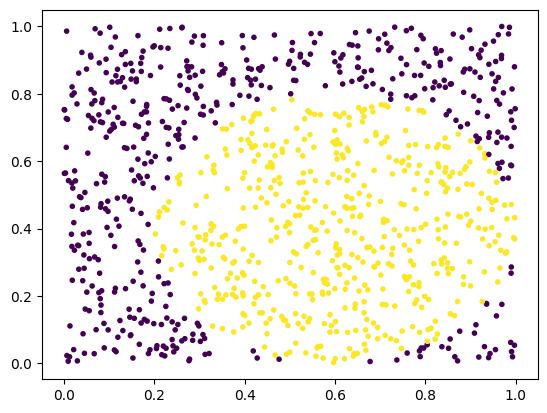

In [3]:
def visualize(x=None, y=None, y_predicted=None, axis=None):
    nitems = x.shape[0]
    assert y.shape == (nitems,)    
    assert x.ndim == 2 

    if y_predicted is not None:
        assert y_predicted.shape == y.shape
        wrong_predictions = y!=y_predicted
    else:
        wrong_predictions = slice(0)
    
    if axis is None:
        _fig, axis = plt.subplots()
        
    if x.shape[1] == 2: # Scatter plot vizualization
        axis.scatter(x=x[wrong_predictions,0], y=x[wrong_predictions,1], c='r', marker=',')
        axis.scatter(x=x[:,0], y=x[:,1], c=y, marker='.')
    else: # Function plot
        axis.plot(x[wrong_predictions,:], c='r', linestyle='solid', linewidth=3)
        axis.plot(x[y==0,:].T, c='y', linestyle='solid')
        axis.plot(x[y==1,:].T, c='b', linestyle='solid')        
        
        

class TestProblem:
    def sample(self, nitems: int) -> (np.ndarray, np.ndarray):
        raise NotImplementedError

    def visualize(self, nitems=1000, axis=None):
        x, y = self.sample(nitems=nitems)
        visualize(x=x, y=y, axis=axis)

class CircleProblem(TestProblem):
    def __init__(self, center: np.ndarray, radius: float):
        self._center = np.array(center)
        assert self._center.ndim == 1
        self._radius = np.float32(radius)

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        distance_to_the_center = np.linalg.norm(x-self._center[None], ord=2, axis=-1)
        y = distance_to_the_center<self._radius
        return x, y

problem = CircleProblem(center=(0.6, 0.4), radius=0.4)
problem.visualize()
plt.show()

Training data:
Confusion matrix:
 [[511   5]
 [ 10 474]]
Recall 99.03%, precision 98.08%, f1-measure 98.55%
Test data:
Confusion matrix:
 [[50  0]
 [ 1 49]]
Recall 100.00%, precision 98.04%, f1-measure 99.01%


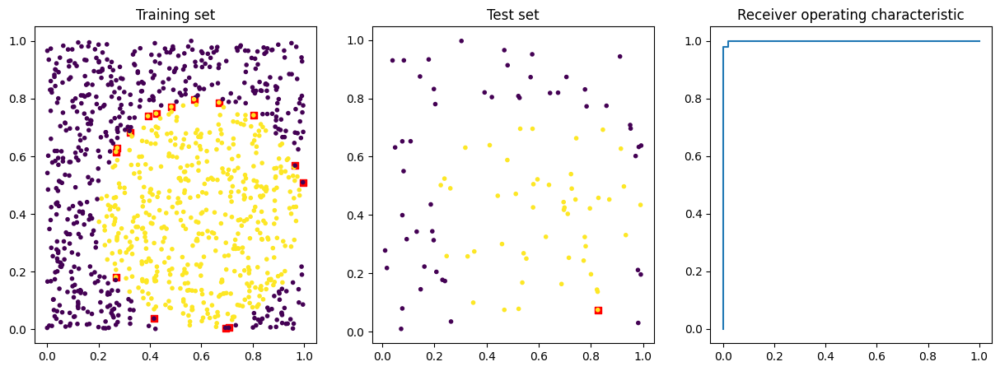

In [5]:
from sklearn import metrics

def confusion_matrix(y, y_predicted):
    mx = np.maximum(np.max(y),np.max(y_predicted))
    confusion_matrix = np.zeros((mx+1, mx+1), dtype=np.int32)
    for r, c in zip(y,y_predicted):
        confusion_matrix[r,c] += 1
    return confusion_matrix

def print_metrics(y, y_predicted):
    y = np.array(y, dtype=np.int8)
    y_predicted = np.array(y_predicted, dtype=np.int8)
    
    cm = confusion_matrix(y,y_predicted)
    print(f"Confusion matrix:\n", cm)

    if cm.shape[0]==2:
        (TP, FN), (FP, TN) = cm
        recall = TP/(TP+FN)
        precision = TP/(TP+FP)
        f1 = 2*TP/(2*TP+FP+FN)
        print(f"Recall {100*recall:.2f}%, precision {100*precision:.2f}%, f1-measure {100*f1:.2f}%")

def benchmark_classifier(clf, problem, n_training_samples=1000, n_test_samples=100):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    clf.fit(training_x, training_y)

    y_predicted = clf.predict(training_x)
    y_predicted_test = clf.predict(test_x)

    print(colored("Training data:","yellow"))
    print_metrics(training_y, y_predicted)

    print(colored("Test data:",'green'))
    print_metrics(test_y, y_predicted_test)


    fig, (axis1, axis2, axis3) = plt.subplots(ncols=3, figsize=(15, 5))

    visualize(training_x, training_y, y_predicted, axis=axis1)
    axis1.set_title('Training set')

    visualize(test_x, test_y, y_predicted_test, axis=axis2)
    axis2.set_title('Test set')

    scores = clf.decision_function(test_x)
    fpr, tpr, thresholds = metrics.roc_curve(test_y, scores)
    axis3.plot(fpr, tpr)
    axis3.set_title('Receiver operating characteristic')

    plt.show()



from sklearn import svm
clf = svm.SVC()
benchmark_classifier(clf, problem)


## Problems:

1. `CircleProblem` above is an example of complete separation problem, that is a unique class is assigned deterministically to every features vector. However, in many cases the boundary between the classes are blured or the classes overlap. That means that in general only probability distribution of the classes can be defined. 
As an example, consider a test binary classification problem `GaussProblem`, such that an object described by a vector from $\mathbb R^N$ belongs to the first (positives) class with the probability defined by the [multivariate normal distribution](https://en.wikipedia.org/wiki/Multivariate_normal_distribution). The class of every object in the training/test is uniquely defined, despite the fact that the same object can belong to different classes on multiple occurances in the set. Define a class implementing the problem settings.

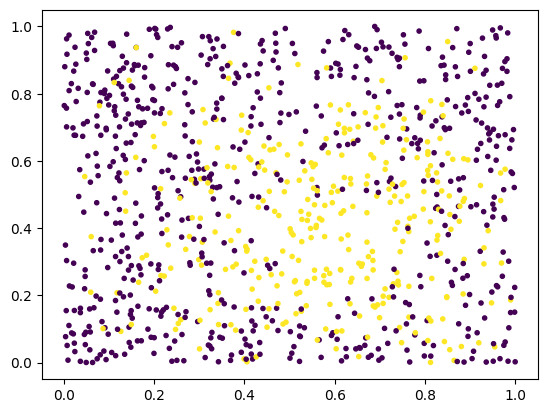

In [6]:
class GaussProblem(TestProblem):
    def __init__(self, center: np.ndarray, radius: float):
        self._center = np.array(center)
        assert self._center.ndim == 1
        self._radius = np.float32(radius)
        
    def score(self, points):
        assert points.ndim==2 and points.shape[1]==self._center.shape[0]
        distance_to_center_squared = np.sum( (points-self._center[None])**2, axis=-1)
        return np.exp(-distance_to_center_squared/(2*self._radius**2))

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        zero_class_probability = self.score(x)
        y = np.random.rand(nitems)<=zero_class_probability
        return x, y

problem = GaussProblem(center=(0.6, 0.4), radius=0.25)
problem.visualize()
plt.show()

Training data:
Confusion matrix:
 [[605  57]
 [171 167]]
Recall 91.39%, precision 77.96%, f1-measure 84.14%
Test data:
Confusion matrix:
 [[53 10]
 [16 21]]
Recall 84.13%, precision 76.81%, f1-measure 80.30%


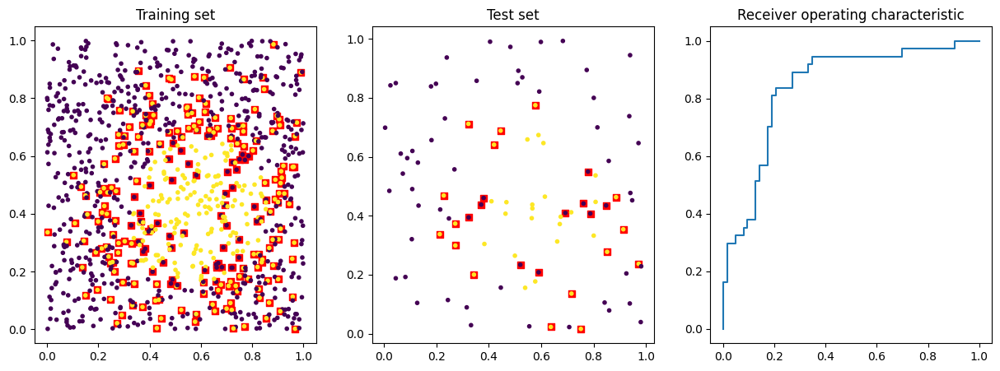

In [7]:
benchmark_classifier(clf, problem)

2. Boundary between the classes in `GaussProblem` is blured in contrast to `CircleProblem`. How does the bluring affect classification metrics?

The results above present that blur results in significant decrease of all metrics: recall, precision and f1-score. Moreover, visualized part present many more points of intersection in the training set and in the test set as well. With ROC-curve one can also notive the metrics decrease: the upper left corner, which is usually considered as optimal in study process, in this case is located more far from "the perfect point" (0,1).

3. Check parameters of the classifiers and tune them to avoid overfitting.

Testing C=0.01, gamma=0.01
Training data:
Confusion matrix:
 [[619   0]
 [381   0]]
Recall 100.00%, precision 61.90%, f1-measure 76.47%
Test data:
Confusion matrix:
 [[68  0]
 [32  0]]
Recall 100.00%, precision 68.00%, f1-measure 80.95%


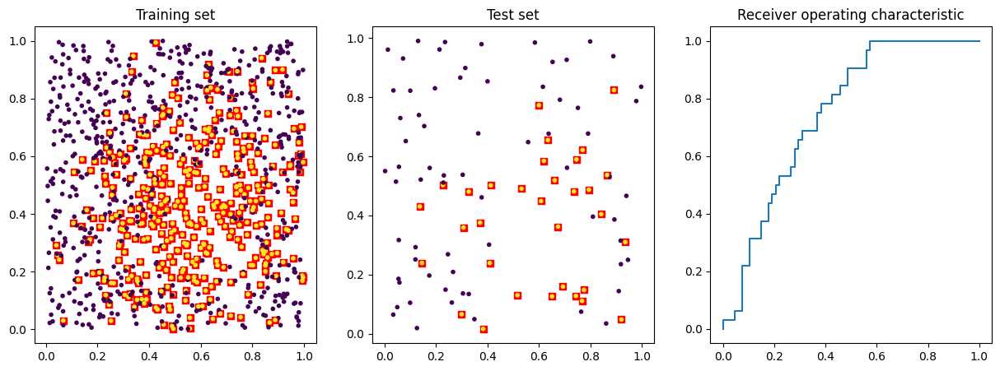

Testing C=0.01, gamma=0.1
Training data:
Confusion matrix:
 [[666   0]
 [334   0]]
Recall 100.00%, precision 66.60%, f1-measure 79.95%
Test data:
Confusion matrix:
 [[72  0]
 [28  0]]
Recall 100.00%, precision 72.00%, f1-measure 83.72%


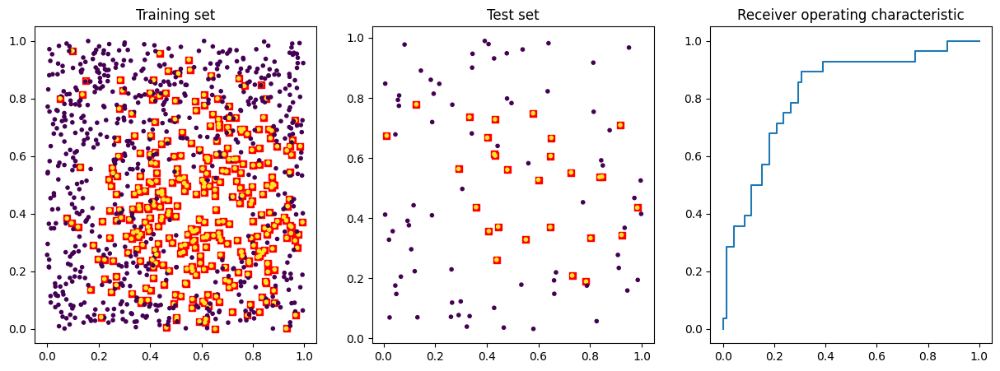

Testing C=0.01, gamma=1
Training data:
Confusion matrix:
 [[685   0]
 [315   0]]
Recall 100.00%, precision 68.50%, f1-measure 81.31%
Test data:
Confusion matrix:
 [[65  0]
 [35  0]]
Recall 100.00%, precision 65.00%, f1-measure 78.79%


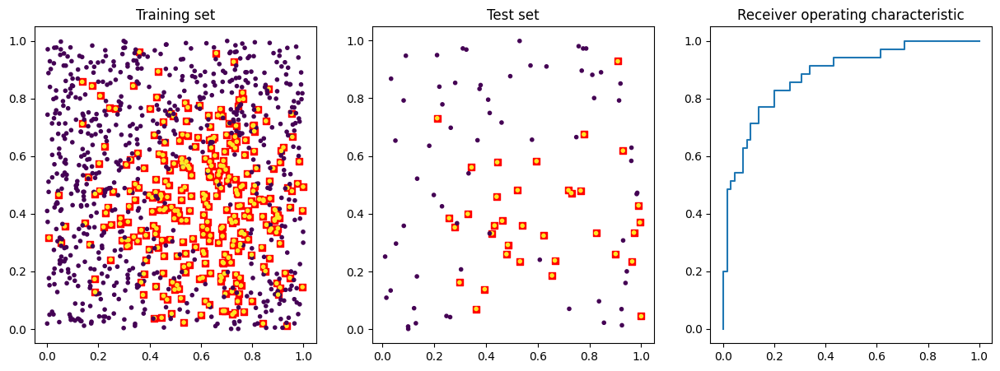

Testing C=0.01, gamma=10
Training data:
Confusion matrix:
 [[662   0]
 [338   0]]
Recall 100.00%, precision 66.20%, f1-measure 79.66%
Test data:
Confusion matrix:
 [[66  0]
 [34  0]]
Recall 100.00%, precision 66.00%, f1-measure 79.52%


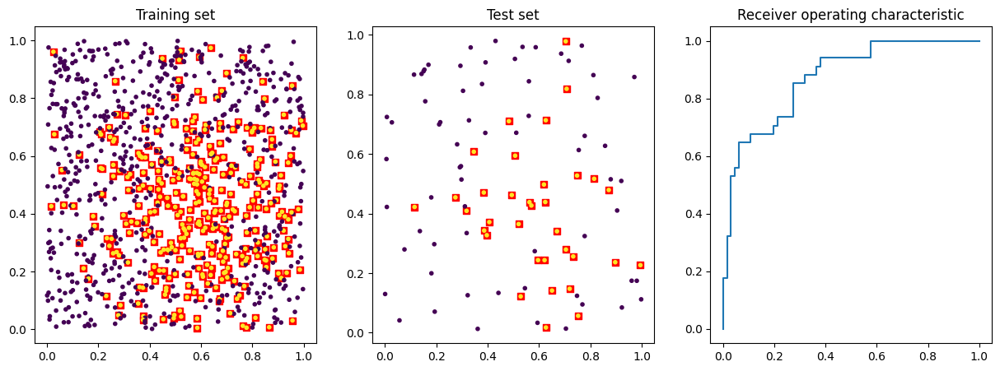

Testing C=0.01, gamma=100
Training data:
Confusion matrix:
 [[647   0]
 [353   0]]
Recall 100.00%, precision 64.70%, f1-measure 78.57%
Test data:
Confusion matrix:
 [[68  0]
 [32  0]]
Recall 100.00%, precision 68.00%, f1-measure 80.95%


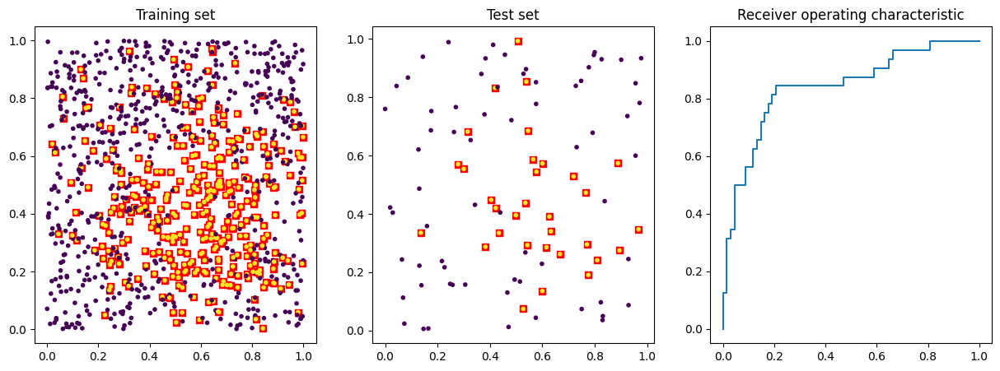

Testing C=0.1, gamma=0.01
Training data:
Confusion matrix:
 [[673   0]
 [327   0]]
Recall 100.00%, precision 67.30%, f1-measure 80.45%
Test data:
Confusion matrix:
 [[64  0]
 [36  0]]
Recall 100.00%, precision 64.00%, f1-measure 78.05%


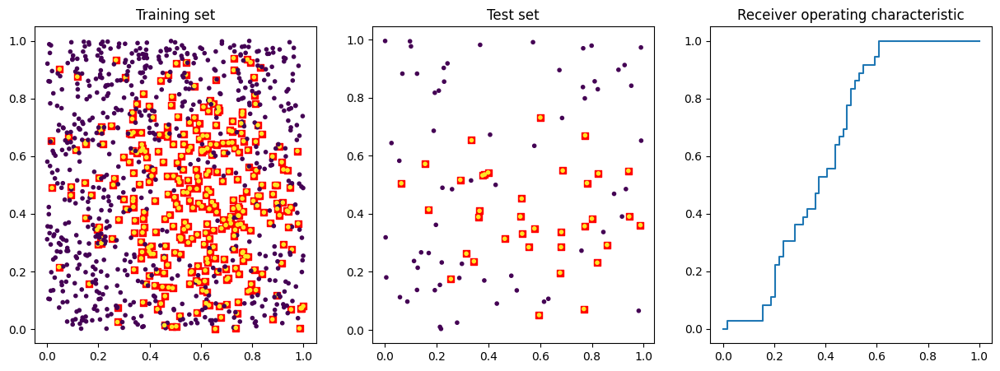

Testing C=0.1, gamma=0.1
Training data:
Confusion matrix:
 [[649   0]
 [351   0]]
Recall 100.00%, precision 64.90%, f1-measure 78.71%
Test data:
Confusion matrix:
 [[73  0]
 [27  0]]
Recall 100.00%, precision 73.00%, f1-measure 84.39%


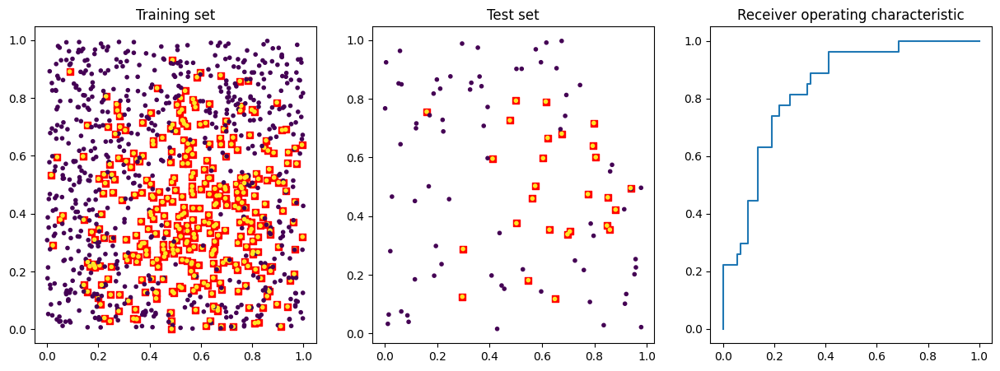

Testing C=0.1, gamma=1
Training data:
Confusion matrix:
 [[657   0]
 [343   0]]
Recall 100.00%, precision 65.70%, f1-measure 79.30%
Test data:
Confusion matrix:
 [[66  0]
 [34  0]]
Recall 100.00%, precision 66.00%, f1-measure 79.52%


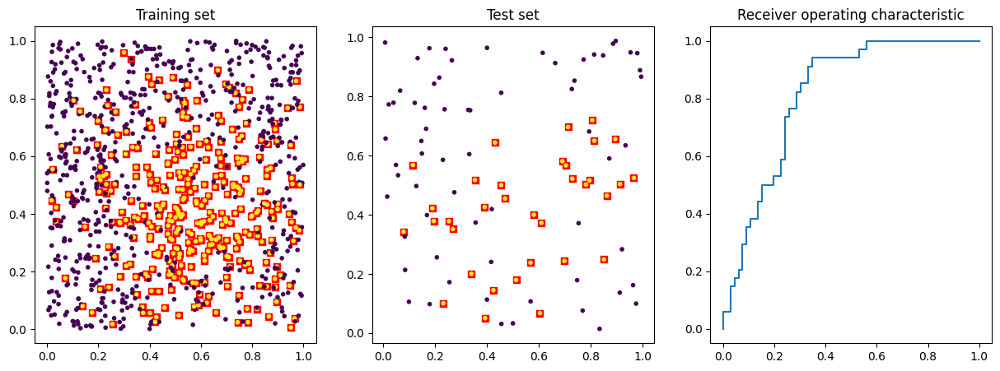

Testing C=0.1, gamma=10
Training data:
Confusion matrix:
 [[634  39]
 [173 154]]
Recall 94.21%, precision 78.56%, f1-measure 85.68%
Test data:
Confusion matrix:
 [[54  8]
 [20 18]]
Recall 87.10%, precision 72.97%, f1-measure 79.41%


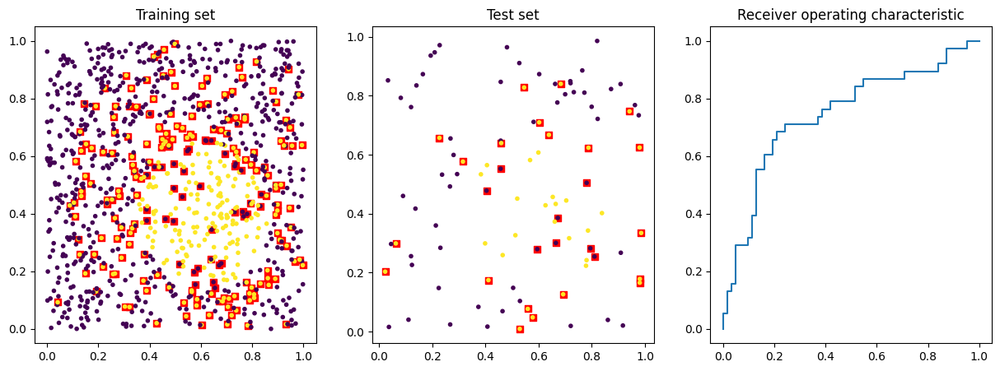

Testing C=0.1, gamma=100
Training data:
Confusion matrix:
 [[619  33]
 [197 151]]
Recall 94.94%, precision 75.86%, f1-measure 84.33%
Test data:
Confusion matrix:
 [[58  6]
 [26 10]]
Recall 90.62%, precision 69.05%, f1-measure 78.38%


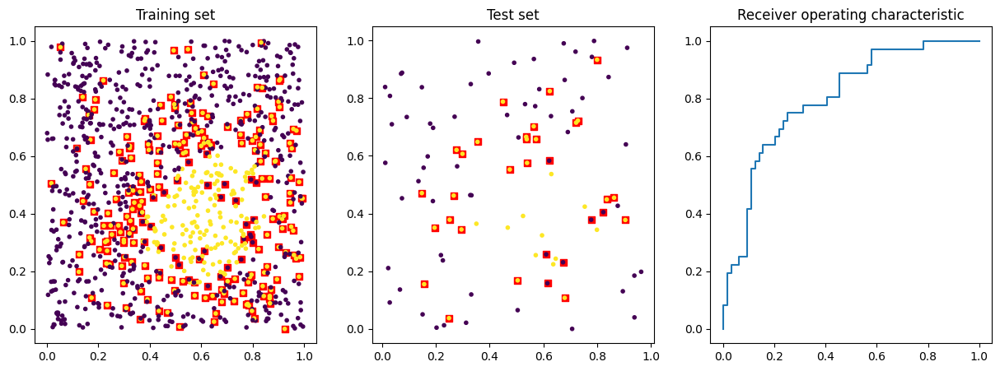

Testing C=1, gamma=0.01
Training data:
Confusion matrix:
 [[671   0]
 [329   0]]
Recall 100.00%, precision 67.10%, f1-measure 80.31%
Test data:
Confusion matrix:
 [[68  0]
 [32  0]]
Recall 100.00%, precision 68.00%, f1-measure 80.95%


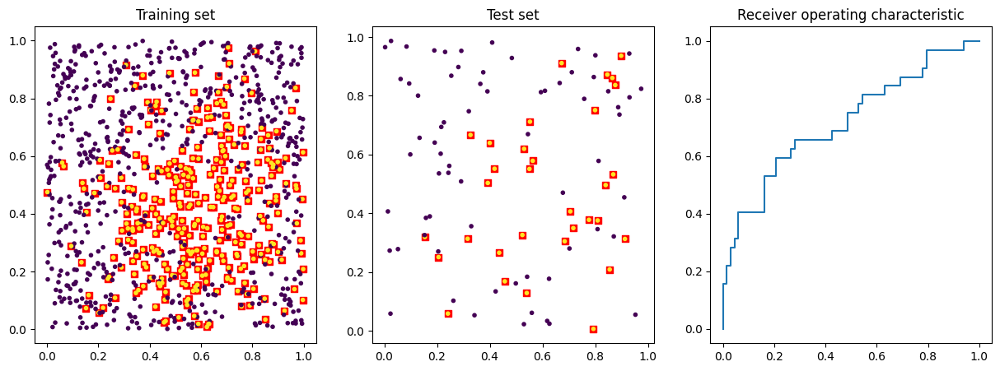

Testing C=1, gamma=0.1
Training data:
Confusion matrix:
 [[675   0]
 [325   0]]
Recall 100.00%, precision 67.50%, f1-measure 80.60%
Test data:
Confusion matrix:
 [[71  0]
 [29  0]]
Recall 100.00%, precision 71.00%, f1-measure 83.04%


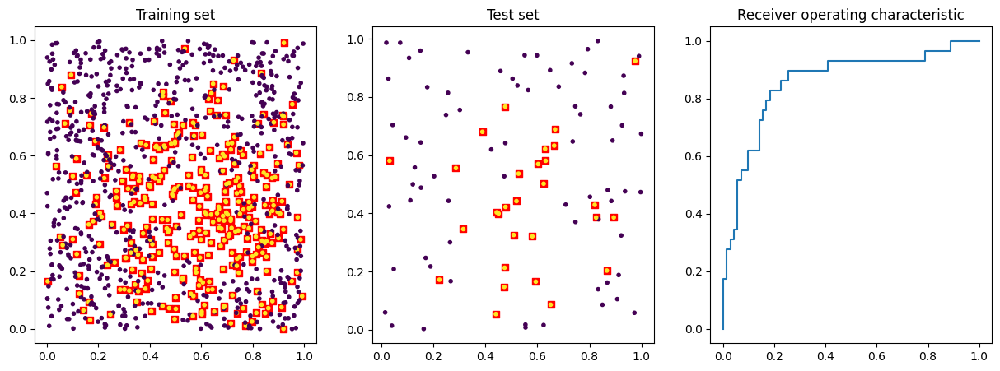

Testing C=1, gamma=1
Training data:
Confusion matrix:
 [[545 101]
 [117 237]]
Recall 84.37%, precision 82.33%, f1-measure 83.33%
Test data:
Confusion matrix:
 [[60 10]
 [ 7 23]]
Recall 85.71%, precision 89.55%, f1-measure 87.59%


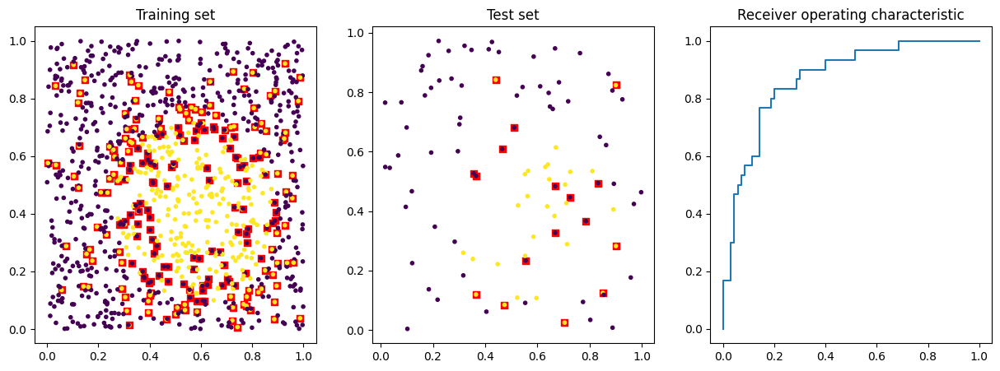

Testing C=1, gamma=10
Training data:
Confusion matrix:
 [[632  45]
 [182 141]]
Recall 93.35%, precision 77.64%, f1-measure 84.78%
Test data:
Confusion matrix:
 [[63  6]
 [21 10]]
Recall 91.30%, precision 75.00%, f1-measure 82.35%


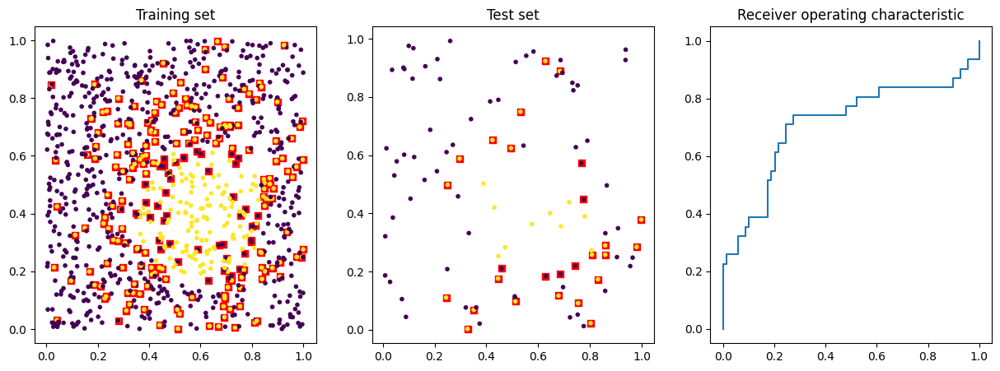

Testing C=1, gamma=100
Training data:
Confusion matrix:
 [[600  53]
 [160 187]]
Recall 91.88%, precision 78.95%, f1-measure 84.93%
Test data:
Confusion matrix:
 [[58  4]
 [16 22]]
Recall 93.55%, precision 78.38%, f1-measure 85.29%


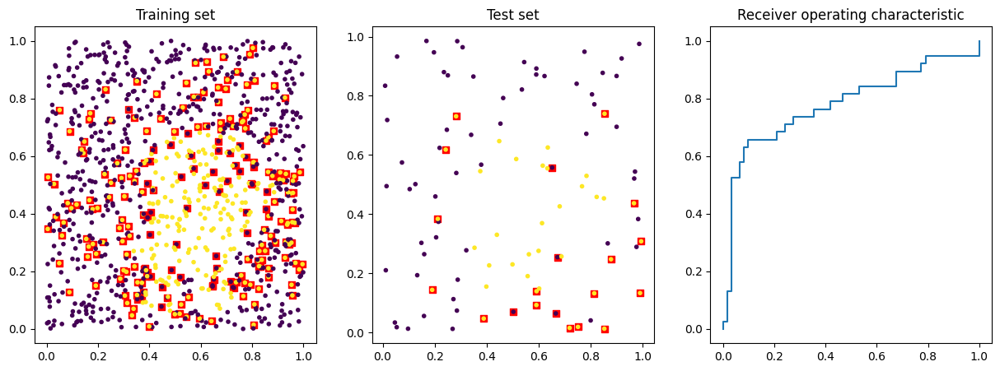

Testing C=10, gamma=0.01
Training data:
Confusion matrix:
 [[633   0]
 [367   0]]
Recall 100.00%, precision 63.30%, f1-measure 77.53%
Test data:
Confusion matrix:
 [[70  0]
 [30  0]]
Recall 100.00%, precision 70.00%, f1-measure 82.35%


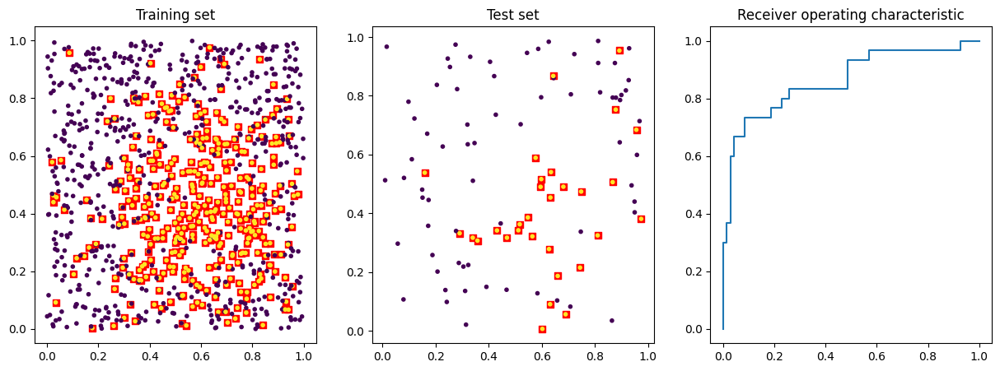

Testing C=10, gamma=0.1
Training data:
Confusion matrix:
 [[685   0]
 [315   0]]
Recall 100.00%, precision 68.50%, f1-measure 81.31%
Test data:
Confusion matrix:
 [[53  0]
 [47  0]]
Recall 100.00%, precision 53.00%, f1-measure 69.28%


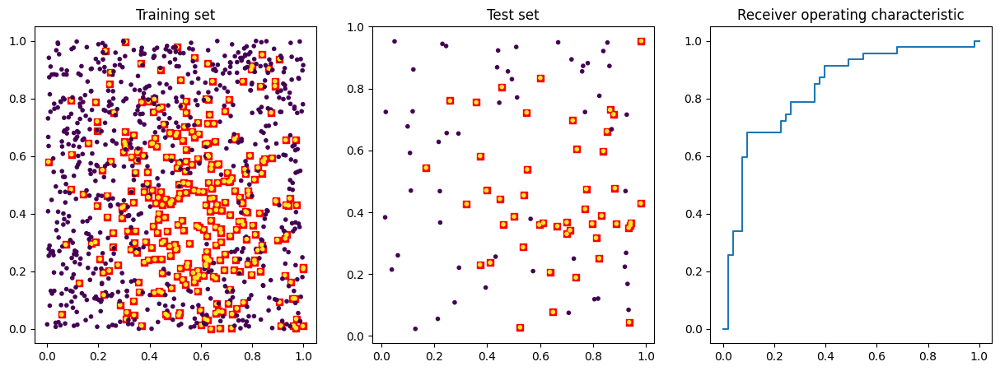

Testing C=10, gamma=1
Training data:
Confusion matrix:
 [[568  93]
 [135 204]]
Recall 85.93%, precision 80.80%, f1-measure 83.28%
Test data:
Confusion matrix:
 [[48 16]
 [20 16]]
Recall 75.00%, precision 70.59%, f1-measure 72.73%


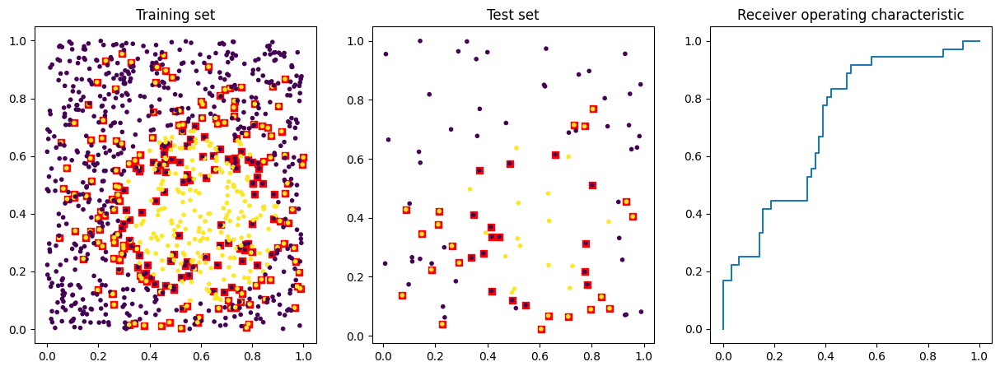

Testing C=10, gamma=10
Training data:
Confusion matrix:
 [[610  58]
 [153 179]]
Recall 91.32%, precision 79.95%, f1-measure 85.26%
Test data:
Confusion matrix:
 [[55  7]
 [13 25]]
Recall 88.71%, precision 80.88%, f1-measure 84.62%


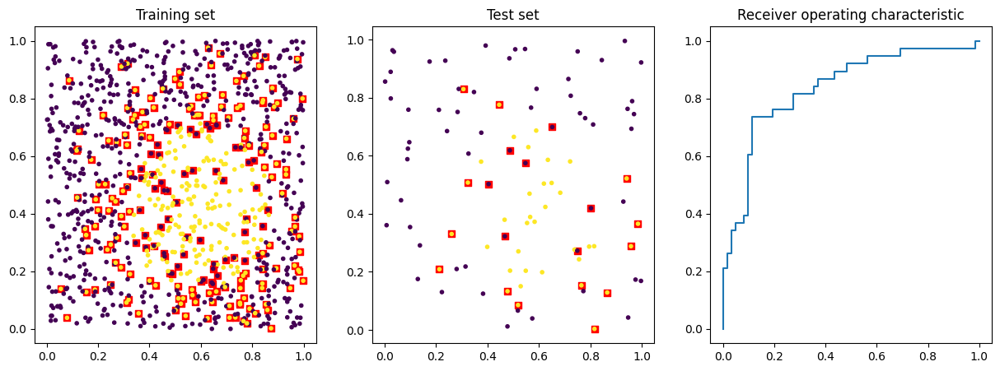

Testing C=10, gamma=100
Training data:
Confusion matrix:
 [[600  64]
 [120 216]]
Recall 90.36%, precision 83.33%, f1-measure 86.71%
Test data:
Confusion matrix:
 [[54  9]
 [12 25]]
Recall 85.71%, precision 81.82%, f1-measure 83.72%


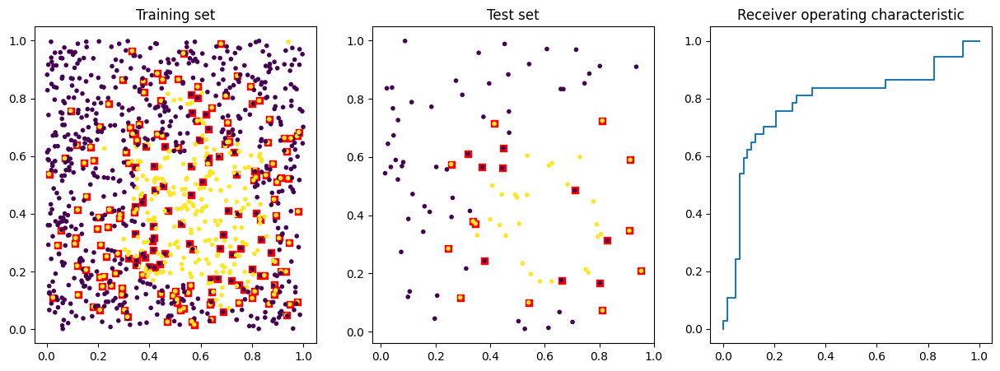

Testing C=100, gamma=0.01
Training data:
Confusion matrix:
 [[642   0]
 [358   0]]
Recall 100.00%, precision 64.20%, f1-measure 78.20%
Test data:
Confusion matrix:
 [[71  0]
 [29  0]]
Recall 100.00%, precision 71.00%, f1-measure 83.04%


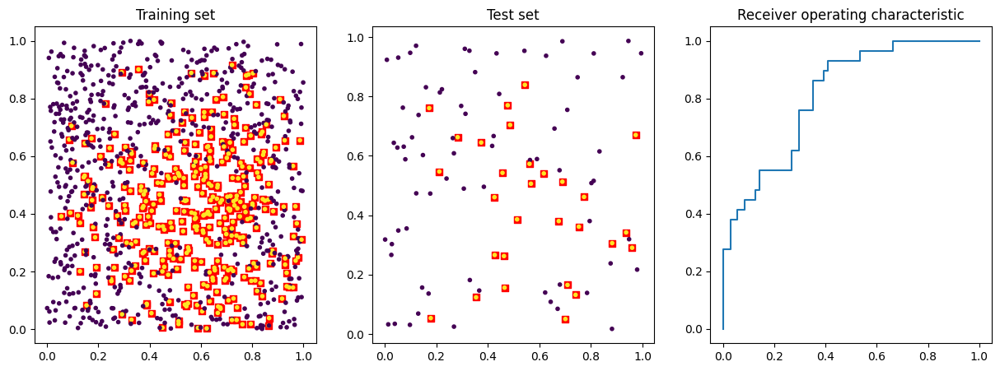

Testing C=100, gamma=0.1
Training data:
Confusion matrix:
 [[521 131]
 [ 93 255]]
Recall 79.91%, precision 84.85%, f1-measure 82.31%
Test data:
Confusion matrix:
 [[49 23]
 [ 7 21]]
Recall 68.06%, precision 87.50%, f1-measure 76.56%


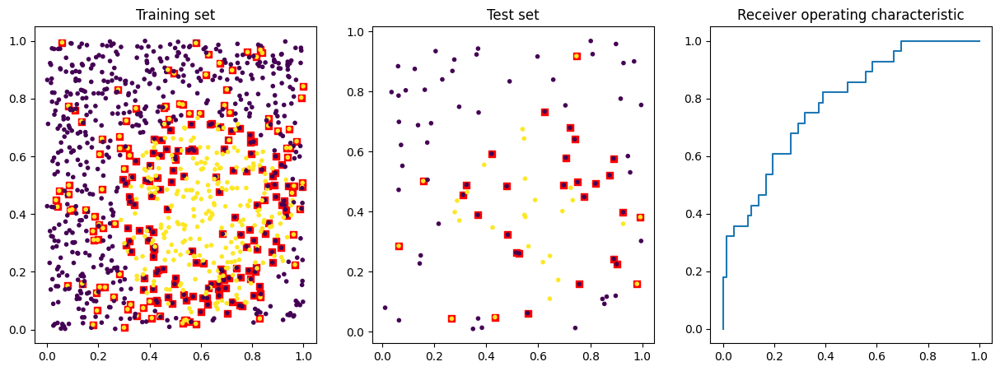

Testing C=100, gamma=1
Training data:
Confusion matrix:
 [[559  72]
 [130 239]]
Recall 88.59%, precision 81.13%, f1-measure 84.70%
Test data:
Confusion matrix:
 [[59  9]
 [12 20]]
Recall 86.76%, precision 83.10%, f1-measure 84.89%


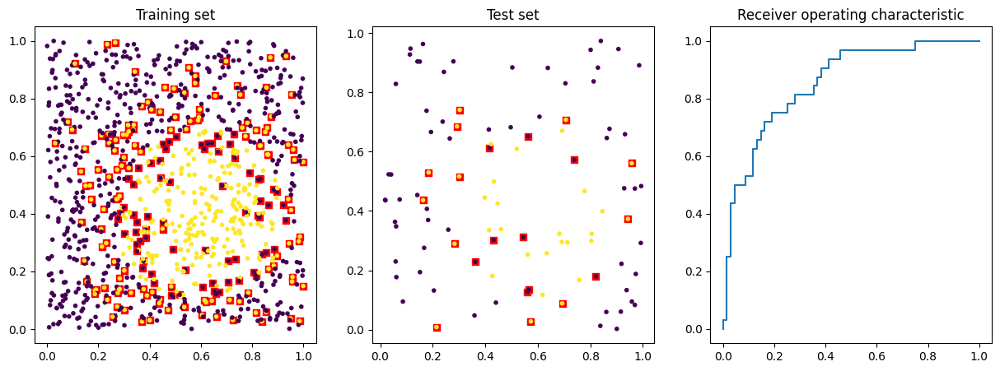

Testing C=100, gamma=10
Training data:
Confusion matrix:
 [[601  69]
 [118 212]]
Recall 89.70%, precision 83.59%, f1-measure 86.54%
Test data:
Confusion matrix:
 [[61  8]
 [14 17]]
Recall 88.41%, precision 81.33%, f1-measure 84.72%


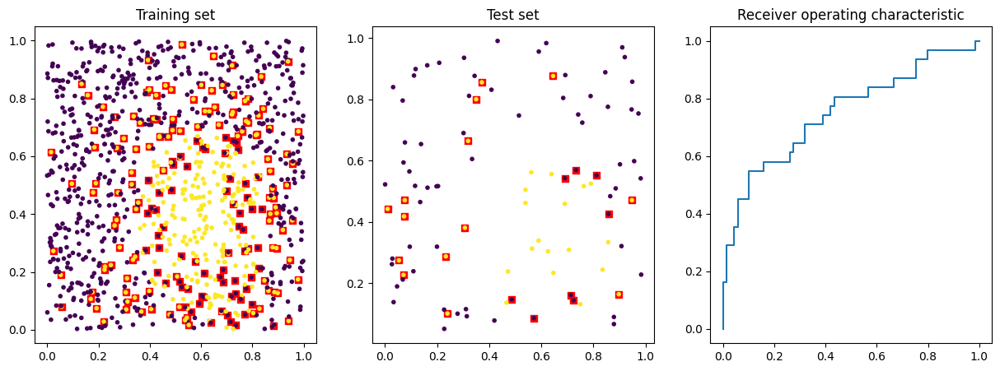

Testing C=100, gamma=100
Training data:
Confusion matrix:
 [[583  60]
 [ 97 260]]
Recall 90.67%, precision 85.74%, f1-measure 88.13%
Test data:
Confusion matrix:
 [[54  9]
 [19 18]]
Recall 85.71%, precision 73.97%, f1-measure 79.41%


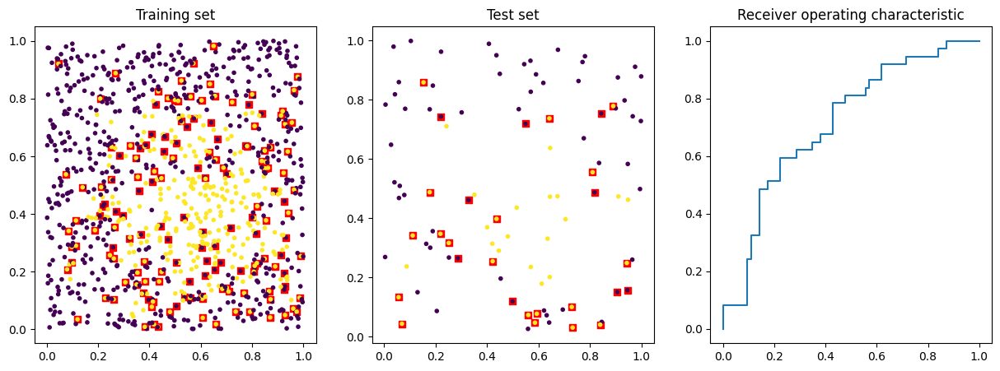

In [12]:
C_values = [0.01, 0.1, 1, 10, 100]
gamma_values = [0.01, 0.1, 1, 10, 100]

for C in C_values:
    for gamma in gamma_values:
        print(colored(f"Testing C={C}, gamma={gamma}", "blue"))
        clf = svm.SVC(C=C, gamma=gamma)
        benchmark_classifier(clf, problem)

In [17]:
from sklearn.model_selection import GridSearchCV

def grid_search_on_problem(problem, classifier, param_grid, n_training_samples=1000, n_test_samples=100, cv=5, scoring='accuracy'):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    grid_search = GridSearchCV(classifier, param_grid, cv=cv, scoring=scoring)
    grid_search.fit(training_x, training_y)

    print(colored(f"Best parameters: {grid_search.best_params_}", "green"))
    print(colored(f"Best cross-validation score: {grid_search.best_score_:.2f}", "green"))

    best_clf = grid_search.best_estimator_
    y_predicted_test = best_clf.predict(test_x)
    print(colored("Test set performance with best parameters:", "blue"))
    print_metrics(test_y, y_predicted_test)

    return best_clf
    
param_grid = {
    'C': C_values,
    'gamma': gamma_values
}

Best parameters: {'C': 10, 'gamma': 1}
Best cross-validation score: 0.80
Test set performance with best parameters:
Confusion matrix:
 [[63  9]
 [ 7 21]]
Recall 87.50%, precision 90.00%, f1-measure 88.73%
Training data:
Confusion matrix:
 [[603  78]
 [103 216]]
Recall 88.55%, precision 85.41%, f1-measure 86.95%
Test data:
Confusion matrix:
 [[59  6]
 [13 22]]
Recall 90.77%, precision 81.94%, f1-measure 86.13%


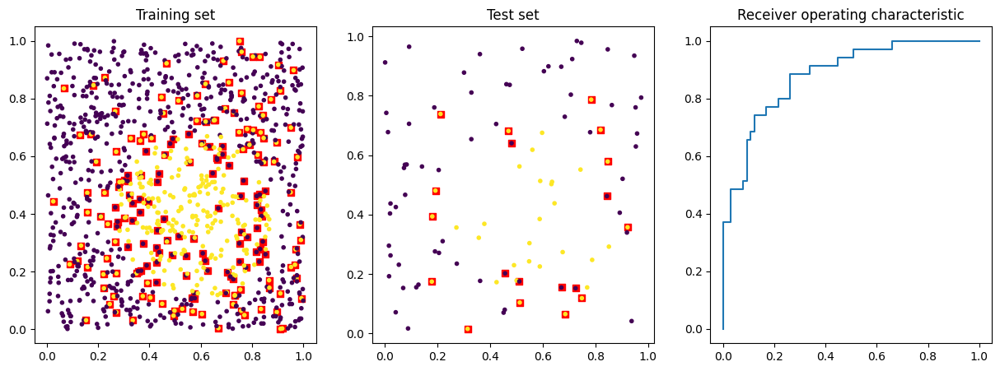

In [18]:
clf = svm.SVC()

best_clf = grid_search_on_problem(problem, clf, param_grid)
benchmark_classifier(best_clf, problem)

Best parameters: {'C': 10, 'gamma': 1}
Best cross-validation score: 0.65
Test set performance with best parameters:
Confusion matrix:
 [[57 13]
 [12 18]]
Recall 81.43%, precision 82.61%, f1-measure 82.01%
Training data:
Confusion matrix:
 [[600  86]
 [146 168]]
Recall 87.46%, precision 80.43%, f1-measure 83.80%
Test data:
Confusion matrix:
 [[65  9]
 [ 9 17]]
Recall 87.84%, precision 87.84%, f1-measure 87.84%


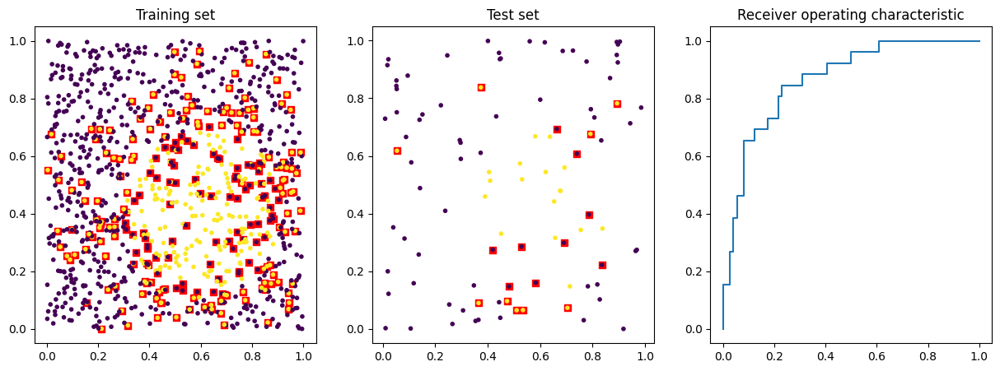

In [21]:
clf = svm.SVC()

best_clf = grid_search_on_problem(problem, clf, param_grid, scoring='f1')
benchmark_classifier(best_clf, problem)

4. Compare classifiers [`KNeighborsClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) impl, [k-nearest neighbors algorithm
](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm), 
[`SVC`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) impl. [support-vector_machine](https://en.wikipedia.org/wiki/Support-vector_machine) with different kernels, 
[`RandomForestClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) impl. [random forest method](https://ru.wikipedia.org/wiki/Random_forest)
from sklearn on `GaussProblem`, you may found usefull [this example](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html). Explain difference in the performance of the classifiers.

In [24]:
def benchmark_classifier(clf, problem, n_training_samples=1000, n_test_samples=100):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    clf.fit(training_x, training_y)

    y_predicted = clf.predict(training_x)
    y_predicted_test = clf.predict(test_x)

    print(colored("Training data:","yellow"))
    print_metrics(training_y, y_predicted)

    print(colored("Test data:",'green'))
    print_metrics(test_y, y_predicted_test)


    fig, (axis1, axis2, axis3) = plt.subplots(ncols=3, figsize=(15, 5))

    visualize(training_x, training_y, y_predicted, axis=axis1)
    axis1.set_title('Training set')

    visualize(test_x, test_y, y_predicted_test, axis=axis2)
    axis2.set_title('Test set')

    if hasattr(clf, "decision_function"):
        scores = clf.decision_function(test_x)
    elif hasattr(clf, "predict_proba"):
        scores = clf.predict_proba(test_x)[:, 1]  # Use probability for ROC curve
    else:
        scores = clf.predict(test_x)
        
    fpr, tpr, thresholds = metrics.roc_curve(test_y, scores)
    axis3.plot(fpr, tpr)
    axis3.set_title('Receiver operating characteristic')

    plt.show()

Classifier: KNeighborsClassifier
Training data:
Confusion matrix:
 [[564  71]
 [123 242]]
Recall 88.82%, precision 82.10%, f1-measure 85.33%
Test data:
Confusion matrix:
 [[56 15]
 [ 7 22]]
Recall 78.87%, precision 88.89%, f1-measure 83.58%


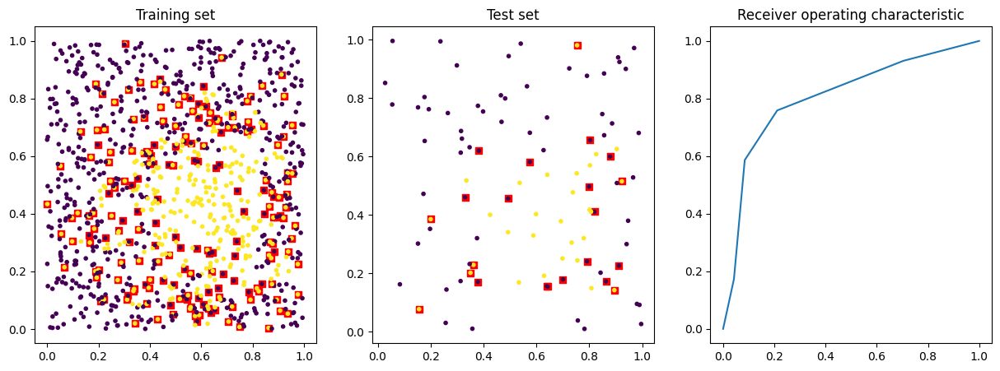

Classifier: SVC (linear)
Training data:
Confusion matrix:
 [[647   0]
 [353   0]]
Recall 100.00%, precision 64.70%, f1-measure 78.57%
Test data:
Confusion matrix:
 [[63  0]
 [37  0]]
Recall 100.00%, precision 63.00%, f1-measure 77.30%


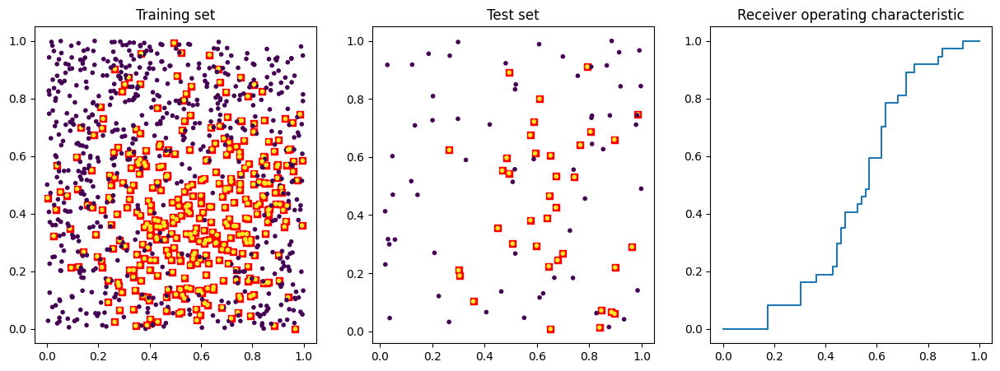

Classifier: SVC (rbf)
Training data:
Confusion matrix:
 [[589  61]
 [160 190]]
Recall 90.62%, precision 78.64%, f1-measure 84.20%
Test data:
Confusion matrix:
 [[56 10]
 [23 11]]
Recall 84.85%, precision 70.89%, f1-measure 77.24%


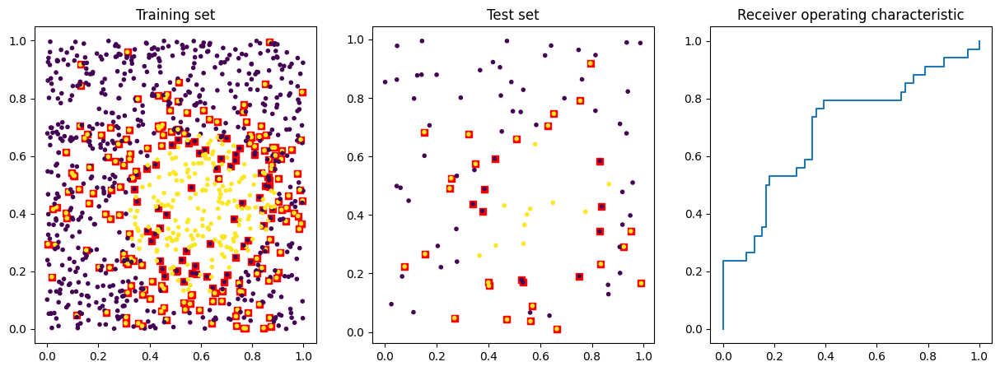

Classifier: RandomForestClassifier
Training data:
Confusion matrix:
 [[567  91]
 [115 227]]
Recall 86.17%, precision 83.14%, f1-measure 84.63%
Test data:
Confusion matrix:
 [[44 13]
 [12 31]]
Recall 77.19%, precision 78.57%, f1-measure 77.88%


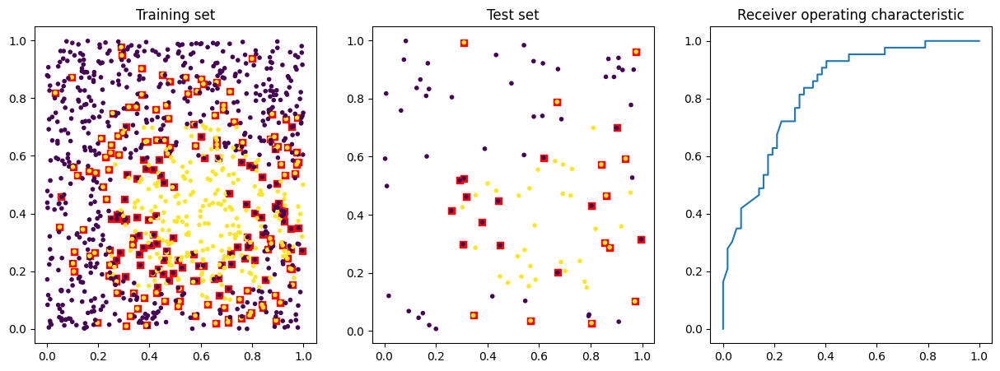

In [25]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

classifiers = {
    "KNeighborsClassifier": KNeighborsClassifier(n_neighbors=5),
    "SVC (linear)": svm.SVC(kernel='linear'),
    "SVC (rbf)": svm.SVC(kernel='rbf'),
    "RandomForestClassifier": RandomForestClassifier(max_depth=5, n_estimators=10)
}

for name, clf in classifiers.items():
    print(colored(f"Classifier: {name}", "blue"))
    benchmark_classifier(clf, problem)

Test accuracy: 0.76
Test accuracy: 0.77
Test accuracy: 0.80
Test accuracy: 0.72


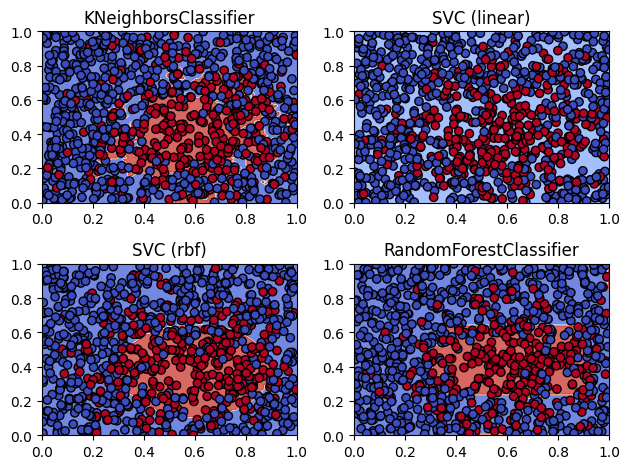

In [26]:
fig, axes = plt.subplots(2, 2)
axes = axes.ravel()

for i, (name, clf) in enumerate(classifiers.items()):
    training_x, training_y = problem.sample(nitems=1000)
    clf.fit(training_x, training_y)
    x_min, x_max = 0, 1
    y_min, y_max = 0, 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    grid_points = np.c_[xx.ravel(), yy.ravel()]
    Z = clf.predict(grid_points)
    Z = Z.reshape(xx.shape)
    
    axes[i].contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)
    axes[i].scatter(training_x[:, 0], training_x[:, 1], c=training_y, edgecolors='k', cmap=plt.cm.coolwarm)
    axes[i].set_title(name)
    axes[i].set_xlim(x_min, x_max)
    axes[i].set_ylim(y_min, y_max)
    
    test_x, test_y = problem.sample(nitems=100)
    y_predicted = clf.predict(test_x)
    accuracy = metrics.accuracy_score(test_y, y_predicted)
    print(colored(f"Test accuracy: {accuracy:.2f}", "green"))

plt.tight_layout()
plt.show()

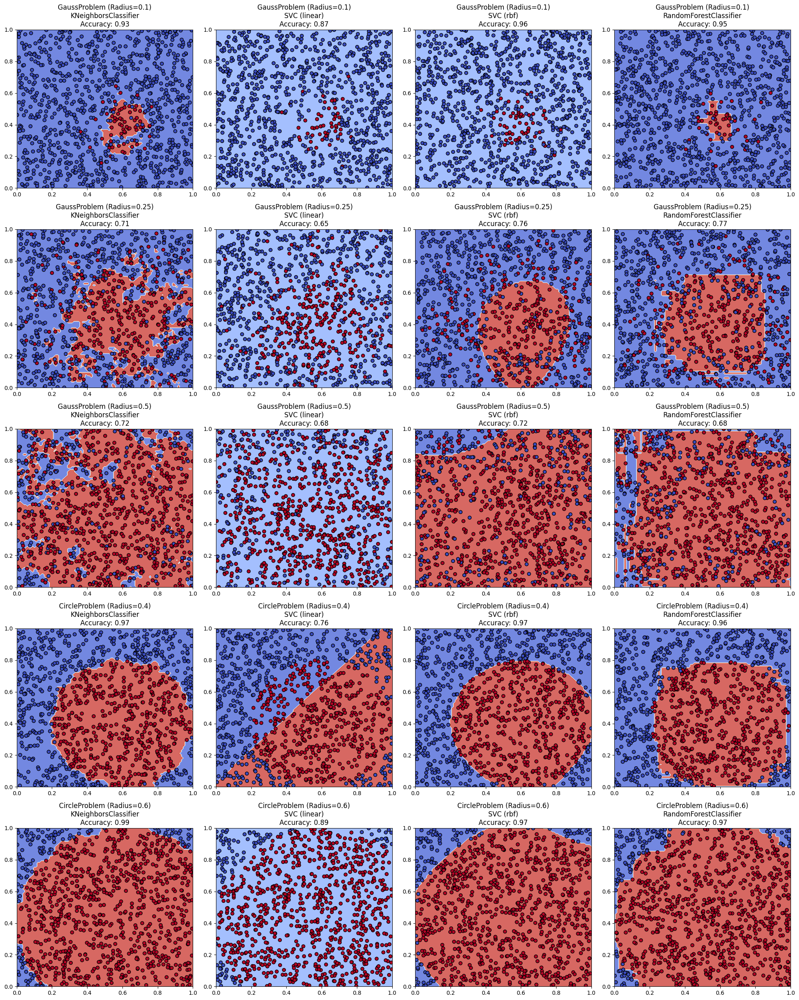

In [27]:
problems = {
    "GaussProblem (Radius=0.1)": GaussProblem(center=(0.6, 0.4), radius=0.1),
    "GaussProblem (Radius=0.25)": GaussProblem(center=(0.6, 0.4), radius=0.25),
    "GaussProblem (Radius=0.5)": GaussProblem(center=(0.6, 0.4), radius=0.5),
    "CircleProblem (Radius=0.4)": CircleProblem(center=(0.6, 0.4), radius=0.4),
    "CircleProblem (Radius=0.6)": CircleProblem(center=(0.6, 0.4), radius=0.6)
}
n_problems = len(problems)
n_classifiers = len(classifiers)
fig, axes = plt.subplots(n_problems, n_classifiers, figsize=(5 * n_classifiers, 5 * n_problems))

for i, (problem_name, problem) in enumerate(problems.items()):
    for j, (clf_name, clf) in enumerate(classifiers.items()):
        training_x, training_y = problem.sample(nitems=1000)
        clf.fit(training_x, training_y)
        
        x_min, x_max = 0, 1
        y_min, y_max = 0, 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        grid_points = np.c_[xx.ravel(), yy.ravel()]
        
        Z = clf.predict(grid_points)
        Z = Z.reshape(xx.shape)
        
        ax = axes[i, j]
        ax.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)
        ax.scatter(training_x[:, 0], training_x[:, 1], c=training_y, edgecolors='k', cmap=plt.cm.coolwarm)
        
        test_x, test_y = problem.sample(nitems=100)
        y_predicted = clf.predict(test_x)
        accuracy = metrics.accuracy_score(test_y, y_predicted)
        
        ax.set_title(f"{problem_name}\n{clf_name}\nAccuracy: {accuracy:.2f}")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

5. Derive class `EllipseProblem` from `TestProblem` that generates plots of Ellipse. Increase dimensionality of the features space and use `KNeighborsClassifier`, do you see any effects of [curse of dimensionality?](https://en.wikipedia.org/wiki/Curse_of_dimensionality)

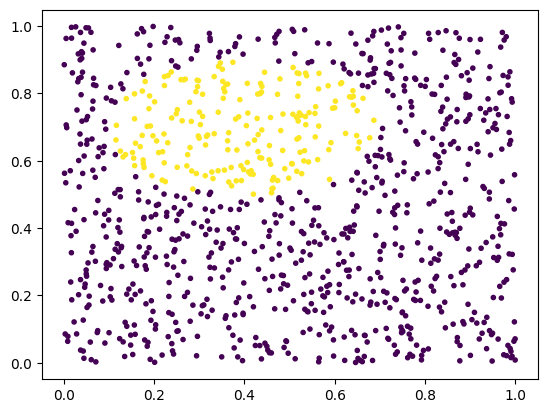

Training data:
Confusion matrix:
 [[806   2]
 [  6 186]]
Recall 99.75%, precision 99.26%, f1-measure 99.51%
Test data:
Confusion matrix:
 [[79  3]
 [ 0 18]]
Recall 96.34%, precision 100.00%, f1-measure 98.14%


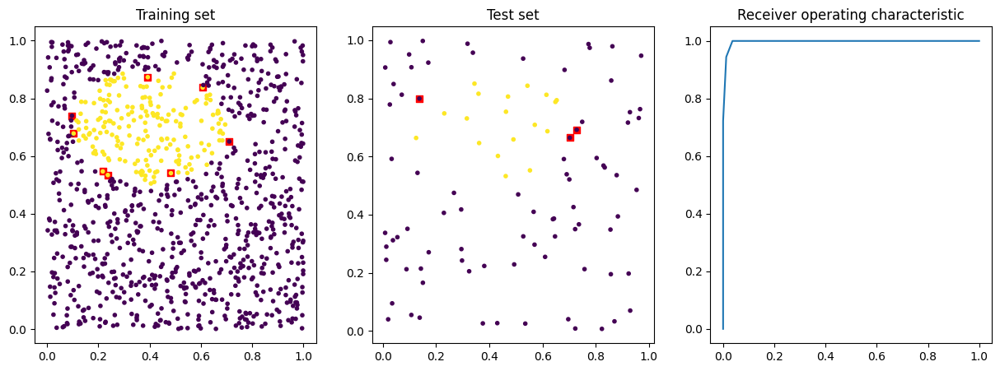

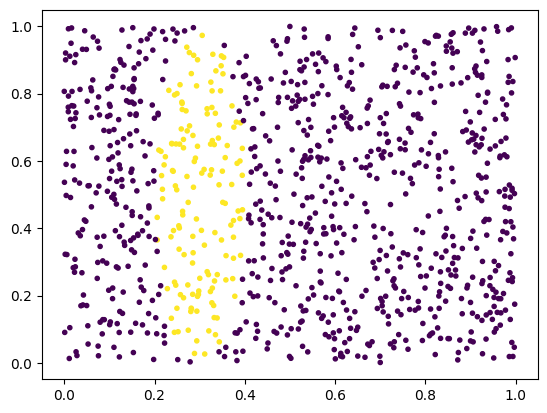

Training data:
Confusion matrix:
 [[830   5]
 [  2 163]]
Recall 99.40%, precision 99.76%, f1-measure 99.58%
Test data:
Confusion matrix:
 [[82  1]
 [ 0 17]]
Recall 98.80%, precision 100.00%, f1-measure 99.39%


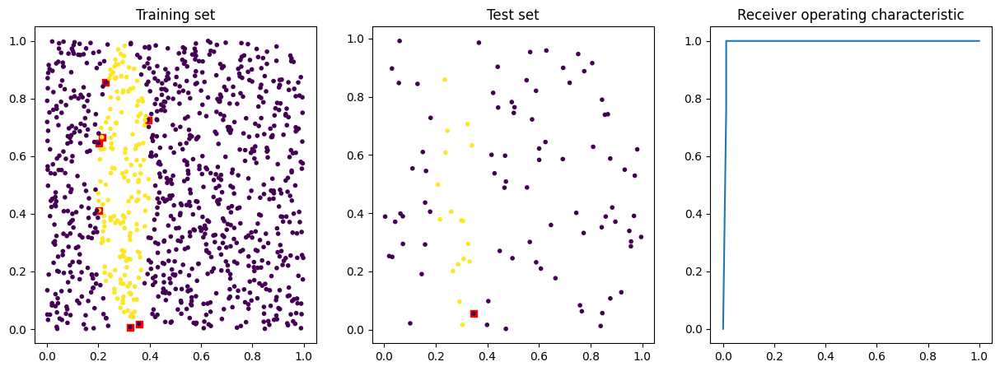

In [28]:
class EllipseProblem(TestProblem):
    def __init__(self, center: np.ndarray, a: float, b: float):
        self._center = np.array(center)
        self._a = np.float32(a)
        self._b = np.float32(b)
        assert self._center.ndim == 1

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        distance_to_center = ((x[:, 0] - self._center[0])**2 / self._a**2) + ((x[:, 1] - self._center[1])**2 / self._b**2)
        y = distance_to_center <= 1
        return x, y

problem = EllipseProblem(center=(0.4, 0.7), a=0.3, b=0.2)
problem.visualize()
plt.show()

clf = KNeighborsClassifier(n_neighbors=5)
benchmark_classifier(clf, problem)

problem = EllipseProblem(center=(0.3, 0.5), a=0.1, b=0.5)
problem.visualize()
plt.show()

clf = KNeighborsClassifier(n_neighbors=5)
benchmark_classifier(clf, problem)

6. Select [important features](https://en.wikipedia.org/wiki/Feature_selection) used by the classifier for `FunctionProblem`. Apply the [principal component analysis](https://en.wikipedia.org/wiki/Principal_component_analysis) and visualize the result. Try to eliminate all features except of the important ones, and check performance of the classifier on the important features. Can you explain, how the classifier decides which class an example belongs to?

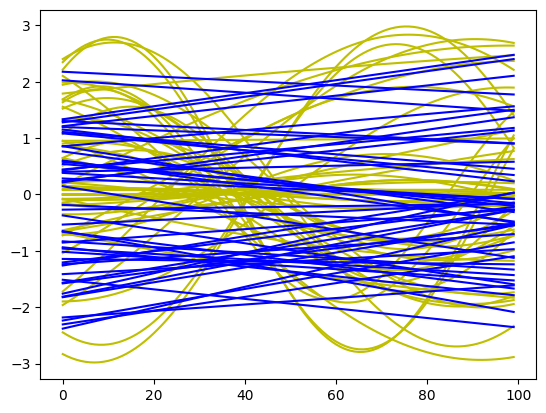

In [36]:
class FunctionProblem(TestProblem):
    def __init__(self, N: int):
        self._N = np.int32(N)
        assert self._N>0
        self._t = np.linspace(-.5,0.5,self._N)
     
    @property
    def t(self):
        return self._t
    
    def sample_zero_class(self, nitems):
        A = np.random.uniform(-3., 3., size=nitems)[:,None]
        B = np.random.uniform(0., 2*np.pi, size=nitems)[:,None]
        C = np.random.uniform(0., 1., size=nitems)[:,None]
        return A*np.sin(B*self.t[None]+C)
    
    def sample_first_class(self, nitems):
        D = np.random.uniform(-2., 2., size=nitems)[:,None]
        E = np.random.uniform(-2., 2., size=nitems)[:,None]
        return D*self.t[None]+E
    
        
    def sample(self, nitems):
        nitems0 = nitems//2
        nitems1 = nitems - nitems0
        x = np.concatenate((self.sample_zero_class(nitems0), self.sample_first_class(nitems1)), axis=0)
        y = np.concatenate((np.zeros(nitems0), np.ones(nitems1)), axis=0)
        assert x.shape == (nitems, self._N)
        assert y.shape == (nitems,)        
        perm = np.random.permutation(nitems)
        return x[perm], y[perm]
    
problem = FunctionProblem(N=100)
problem.visualize(100)
plt.show()

In [37]:
from sklearn.base import BaseEstimator, TransformerMixin

class PCAProblem(FunctionProblem):
    def __init__(self, original_problem, pca):
        self.original_problem = original_problem
        self.pca = pca

    def sample(self, nitems):
        x, y = self.original_problem.sample(nitems)
        x_transformed = self.pca.transform(x)
        return x_transformed, y

class FeatureSelectedProblem(FunctionProblem):
    def __init__(self, original_problem, selector):
        self.original_problem = original_problem
        self.selector = selector

    def sample(self, nitems):
        x, y = self.original_problem.sample(nitems)
        x_transformed = self.selector.transform(x)
        return x_transformed, y

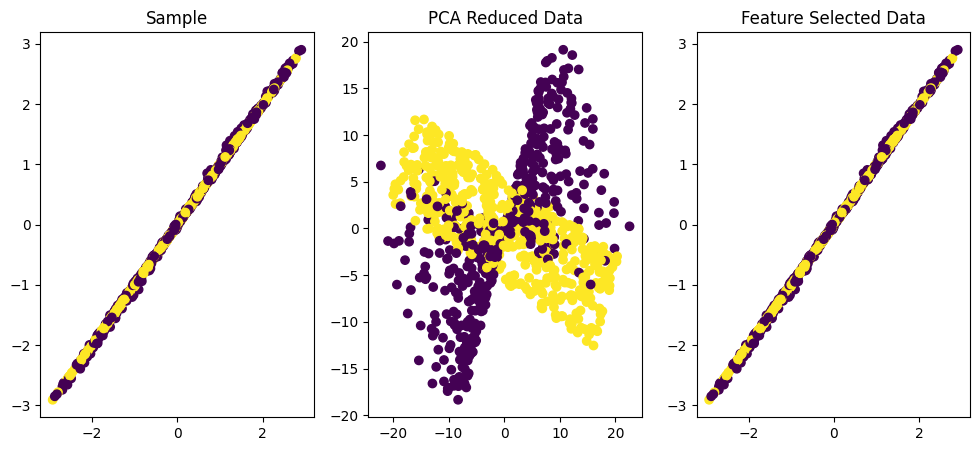

In [40]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
x, y = problem.sample(1000)

pca = PCA(n_components=2)
x_pca = pca.fit_transform(x)

selector = SelectKBest(f_classif, k=4)
x_selected = selector.fit_transform(x, y)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(12, 5))
ax0.scatter(x[:, 0], x[:, 1], c=y)
ax0.set_title('Sample')

ax1.scatter(x_pca[:, 0], x_pca[:, 1], c=y)
ax1.set_title('PCA Reduced Data')

ax2.scatter(x_selected[:, 0], x_selected[:, 1], c=y)
ax2.set_title('Feature Selected Data')
plt.show()

Non-Reduced Data:
Training data:
Confusion matrix:
 [[440  60]
 [ 31 469]]
Recall 88.00%, precision 93.42%, f1-measure 90.63%
Test data:
Confusion matrix:
 [[44  6]
 [ 8 42]]
Recall 88.00%, precision 84.62%, f1-measure 86.27%


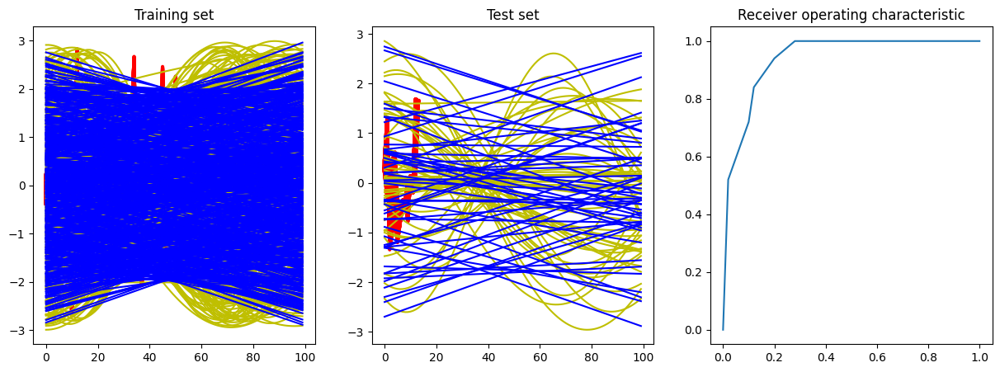

PCA Reduced Data:
Training data:
Confusion matrix:
 [[437  63]
 [ 49 451]]
Recall 87.40%, precision 89.92%, f1-measure 88.64%
Test data:
Confusion matrix:
 [[42  8]
 [ 6 44]]
Recall 84.00%, precision 87.50%, f1-measure 85.71%


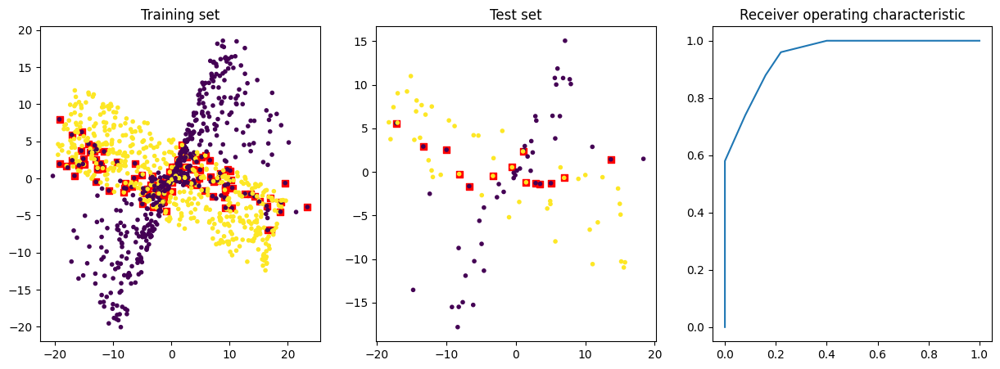

Feature Selected Data:
Training data:
Confusion matrix:
 [[330 170]
 [ 85 415]]
Recall 66.00%, precision 79.52%, f1-measure 72.13%
Test data:
Confusion matrix:
 [[21 29]
 [10 40]]
Recall 42.00%, precision 67.74%, f1-measure 51.85%


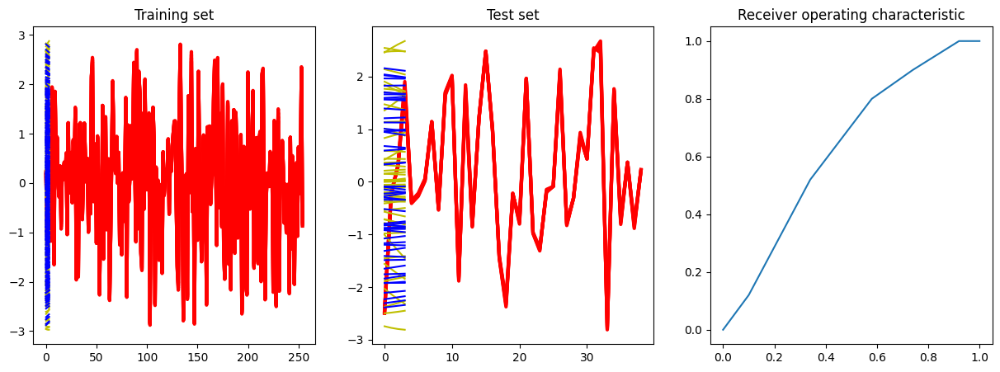

In [41]:
clf = KNeighborsClassifier(n_neighbors=5)

print(colored("Non-Reduced Data:", "blue"))
benchmark_classifier(clf, problem)

print(colored("PCA Reduced Data:", "blue"))
pca_problem = PCAProblem(problem, pca)
benchmark_classifier(clf, pca_problem)

print(colored("Feature Selected Data:", "blue"))
feature_selected_problem = FeatureSelectedProblem(problem, selector)
benchmark_classifier(clf, feature_selected_problem)